In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pylab import rcParams
import tensorflow as tf
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

%matplotlib inLine
sns.set(style='whitegrid',palette='muted')
rcParams['figure.figsize']=14,8
np.random.seed(1)
tf.random.set_seed(1)
print(tf.__version__)

2.1.0


In [2]:
#Libraries for Model
from keras.models import Sequential
from keras.layers import Dense, LSTM,Dropout,RepeatVector,TimeDistributed,Flatten
from keras.models import model_from_json

Using TensorFlow backend.


In [3]:
#load the model and weights
#Estimator for first converter
json_file = open('../input/models-and-weights/model1.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model_one = model_from_json(loaded_model_json)
# load weights into new model
model_one.load_weights("../input/models-and-weights/model1.h5")

#Estimator for second converter
json_file = open('../input/models-and-weights/model2.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model_two = model_from_json(loaded_model_json)
# load weights into new model
model_two.load_weights("../input/models-and-weights/model2.h5")

#Estimator for third converter
json_file = open('../input/models-and-weights/model3.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model_three = model_from_json(loaded_model_json)
# load weights into new model
model_three.load_weights("../input/models-and-weights/model3.h5")

#Estimator for 4th converter
json_file = open('../input/models-and-weights/model4.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model_four = model_from_json(loaded_model_json)
# load weights into new model
model_four.load_weights("../input/models-and-weights/model4.h5")

In [4]:
#Compile the models
model_one.compile(loss='mae',optimizer='adam')
model_two.compile(loss='mae',optimizer='adam')
model_three.compile(loss='mae',optimizer='adam')
model_four.compile(loss='mae',optimizer='adam')

In [5]:
#Standardization values
train_data = pd.read_csv('../input/error-norm-of-states/HIL_200512_152440.csv')
train_data = train_data[train_data['Time']>0.1]
f1_mean,f1_std = train_data.factor1.mean(),train_data.factor1.std()
f2_mean,f2_std = train_data.factor2.mean(),train_data.factor2.std()
f3_mean,f3_std = train_data.factor3.mean(),train_data.factor3.std()
f4_mean,f4_std = train_data.factor4.mean(),train_data.factor4.std()

In [6]:
#Thresholds
t1 = 8.4
t2 = 5.6
t3 = 6
t4 = 7

### Different scenarios for offline performance before mitigation
### Weights of attack vectors are varied between 0.625% to 20% of the steady state value(constrained FDIA)
#### 1. Node attack with minimum weight (0.625%)

In [7]:
#Load dataset
test1 = pd.read_csv('../input/test-norms/min_weight_node_attack.csv')
test1 = test1[test1.Time>0.1]
test1 = test1.reset_index(drop=True)
test1.head()

,Time,factor1,factor2,factor3,factor4
0,0.1002,0.395747,9.066521,0.000000,0.870703
1,0.1004,2.227635,0.000000,1.819246,0.000000
2,0.1006,1.496044,3.469416,0.000000,3.275510
3,0.1008,0.210891,6.631612,0.494515,0.000000
4,0.1010,3.256899,4.367560,7.148588,0.000000


In [8]:
#Apply same transformation on the test data
#We are using a sequence size of 15
test1.factor1 = (test1.factor1-f1_mean)/f1_std
test1.factor2 = (test1.factor2-f2_mean)/f2_std
test1.factor3 = (test1.factor3-f3_mean)/f3_std
test1.factor4 = (test1.factor4-f4_mean)/f4_std

In [9]:
#plot standardized signals
fig = go.Figure()
fig.add_trace(go.Scatter(x=test1.Time,y=test1.factor1,mode='lines',name='Norm Difference for converter 1'))
fig.add_trace(go.Scatter(x=test1.Time,y=test1.factor2,mode='lines',name='Norm Difference for converter 2'))
fig.add_trace(go.Scatter(x=test1.Time,y=test1.factor3,mode='lines',name='Norm Difference for converter 3'))
fig.add_trace(go.Scatter(x=test1.Time,y=test1.factor4,mode='lines',name='Norm Difference for converter 4'))
fig.update_layout(showlegend=True)
fig.show()

In [10]:
#Create subsequences
def create_sequences(X,Y,time_steps):
    Xs,Ys = [],[]
    for i in range(len(X)-time_steps):
        Xs.append(X.iloc[i:i+time_steps].values)
        Ys.append(Y.iloc[i+time_steps])
    return np.array(Xs),np.array(Ys)

In [11]:
x1_test1,y1_test1 = create_sequences(test1.factor1,test1.factor1,15)
x2_test1,y2_test1 = create_sequences(test1.factor2,test1.factor2,15)
x3_test1,y3_test1 = create_sequences(test1.factor3,test1.factor3,15)
x4_test1,y4_test1 = create_sequences(test1.factor4,test1.factor4,15)
x1_test1 = x1_test1.reshape(x1_test1.shape[0],15,1)
x2_test1 = x2_test1.reshape(x2_test1.shape[0],15,1)
x3_test1 = x3_test1.reshape(x3_test1.shape[0],15,1)
x4_test1 = x4_test1.reshape(x4_test1.shape[0],15,1)
y1_test1 = y1_test1.reshape(y1_test1.shape[0],1)
y2_test1 = y2_test1.reshape(y2_test1.shape[0],1)
y3_test1 = y3_test1.reshape(y3_test1.shape[0],1)
y4_test1 = y4_test1.reshape(y4_test1.shape[0],1)

In [12]:
#Results for the first test
x1_test1_mae = np.mean(np.abs(model_one.predict(x1_test1)-y1_test1),axis=1)
x2_test1_mae = np.mean(np.abs(model_two.predict(x2_test1)-y2_test1),axis=1)
x3_test1_mae = np.mean(np.abs(model_three.predict(x3_test1)-y3_test1),axis=1)
x4_test1_mae = np.mean(np.abs(model_four.predict(x4_test1)-y4_test1),axis=1)
test1_df = pd.DataFrame({'Time':test1.Time[15:],'factor1':test1.factor1[15:],'factor2':test1.factor2[15:],'factor3':test1.factor3[15:],'factor4':test1.factor4[15:]})
test1_df['loss 1'] = x1_test1_mae
test1_df['loss 2'] = x2_test1_mae
test1_df['loss 3'] = x3_test1_mae
test1_df['loss 4'] = x4_test1_mae
test1_df['Anomaly 1'] = test1_df['loss 1']>t1
test1_df['Anomaly 2'] = test1_df['loss 2']>t2
test1_df['Anomaly 3'] = test1_df['loss 3']>t3
test1_df['Anomaly 4'] = test1_df['loss 4']>t4

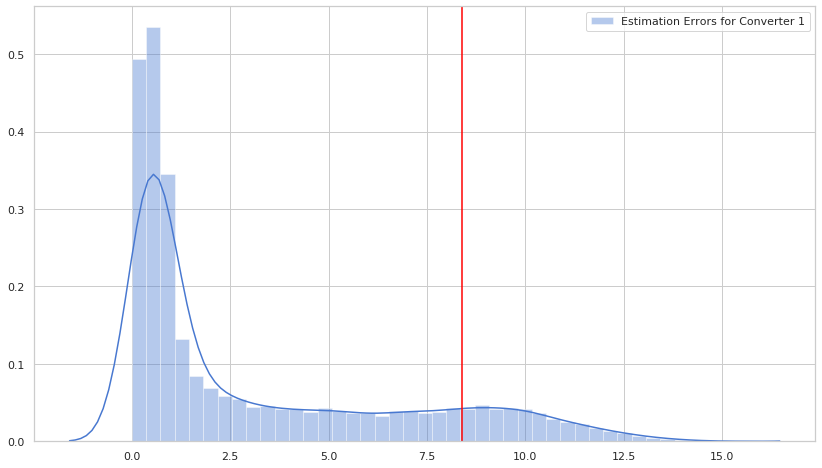

In [13]:
#Converter 1 anomalies
sns.distplot(x1_test1_mae,kde=True,label='Estimation Errors for Converter 1')
plt.legend()
plt.axvline(t1,0,10,color='red')

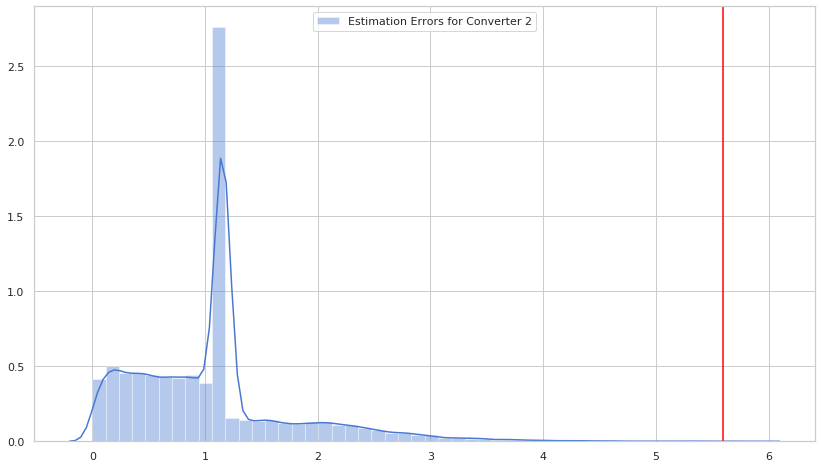

In [14]:
#Converter 2 anomalies
sns.distplot(x2_test1_mae,kde=True,label='Estimation Errors for Converter 2')
plt.legend()
plt.axvline(t2,0,10,color='red')

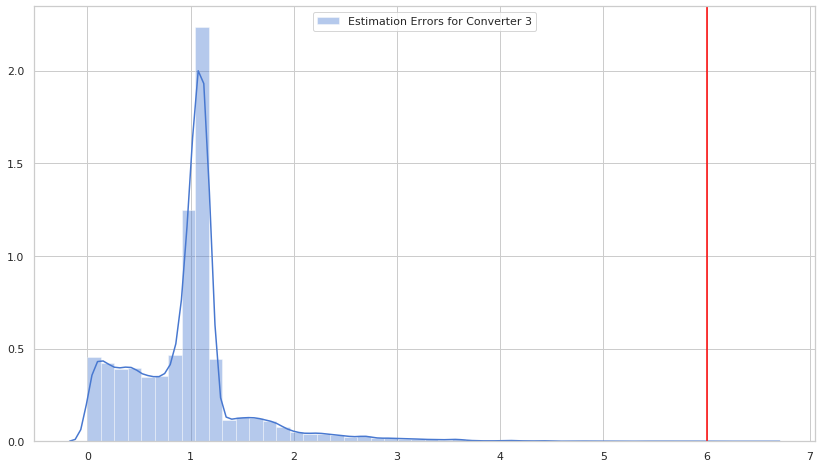

In [15]:
#Converter 3 anomalies
sns.distplot(x3_test1_mae,kde=True,label='Estimation Errors for Converter 3')
plt.legend()
plt.axvline(t3,0,10,color='red')

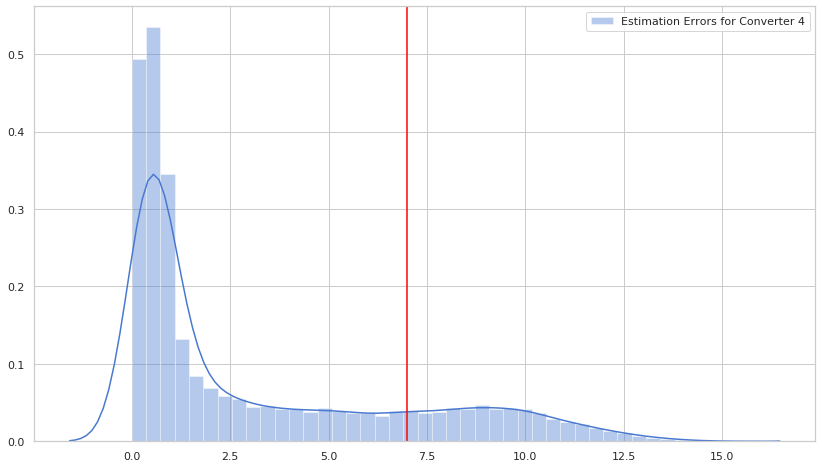

In [16]:
#Converter 4 anomalies
sns.distplot(x1_test1_mae,kde=True,label='Estimation Errors for Converter 4')
plt.legend()
plt.axvline(t4,0,10,color='red')

In [17]:
#Plotting the anomalies for 1st converter
fig = go.Figure()
fig.add_trace(go.Scatter(x=test1.Time[15:],y=(test1.factor1[15:]*f1_std + f1_mean),mode='lines',name='Norm Difference for Converter 1'))
fig.add_trace(go.Scatter(x=test1_df[test1_df['Anomaly 1']==True].Time,y = (test1_df[test1_df['Anomaly 1']==True].factor1*f1_std + f1_mean),mode='markers',name='Anomalies in Converter 1'))
fig.update_layout(showlegend=True)
fig.show()

In [18]:
#Plotting the anomalies for 2nd converter
fig = go.Figure()
fig.add_trace(go.Scatter(x=test1.Time[15:],y=(test1.factor2[15:]*f2_std + f2_mean),mode='lines',name='Norm Difference for Converter 2'))
fig.add_trace(go.Scatter(x=test1_df[test1_df['Anomaly 2']==True].Time,y = (test1_df[test1_df['Anomaly 2']==True].factor2*f2_std + f2_mean),mode='markers',name='Anomalies in Converter 2'))
fig.update_layout(showlegend=True)
fig.show()

In [19]:
#Plotting the anomalies for 3rd converter
fig = go.Figure()
fig.add_trace(go.Scatter(x=test1.Time[15:],y=(test1.factor3[15:]*f3_std + f3_mean),mode='lines',name='Norm Difference for Converter 3'))
fig.add_trace(go.Scatter(x=test1_df[test1_df['Anomaly 3']==True].Time,y = (test1_df[test1_df['Anomaly 3']==True].factor3*f3_std + f3_mean),mode='markers',name='Anomalies in Converter 3'))
fig.update_layout(showlegend=True)
fig.show()

In [20]:
#Plotting the anomalies for 4th converter
fig = go.Figure()
fig.add_trace(go.Scatter(x=test1.Time[15:],y=(test1.factor4[15:]*f4_std + f4_mean),mode='lines',name='Norm Difference for Converter 4'))
fig.add_trace(go.Scatter(x=test1_df[test1_df['Anomaly 4']==True].Time,y = (test1_df[test1_df['Anomaly 4']==True].factor4*f4_std + f4_mean),mode='markers',name='Anomalies in Converter 4'))
fig.update_layout(showlegend=True)
fig.show()

#### 2. Mininimum weight link attack(0.625% of the steady state value)

In [21]:
#Load dataset
test2 = pd.read_csv('../input/test-norms/min_weight_link.csv')
test2 = test2[test2.Time>0.1]
test2 = test2.reset_index(drop=True)
test2.head()

,Time,factor1,factor2,factor3,factor4
0,0.1002,0.395747,9.066521,0.000000,0.870703
1,0.1004,2.227635,0.000000,1.819246,0.000000
2,0.1006,1.496044,3.469416,0.000000,3.275510
3,0.1008,0.210891,6.631612,0.494515,0.000000
4,0.1010,3.256899,4.367560,7.148588,0.000000


In [22]:
#Apply same transformation on the test data
#We are using a sequence size of 15
test2.factor1 = (test2.factor1-f1_mean)/f1_std
test2.factor2 = (test2.factor2-f2_mean)/f2_std
test2.factor3 = (test2.factor3-f3_mean)/f3_std
test2.factor4 = (test2.factor4-f4_mean)/f4_std

In [23]:
#plot standardized signals
fig = go.Figure()
fig.add_trace(go.Scatter(x=test2.Time,y=test2.factor1,mode='lines',name='Norm Difference for converter 1'))
fig.add_trace(go.Scatter(x=test2.Time,y=test2.factor2,mode='lines',name='Norm Difference for converter 2'))
fig.add_trace(go.Scatter(x=test2.Time,y=test2.factor3,mode='lines',name='Norm Difference for converter 3'))
fig.add_trace(go.Scatter(x=test2.Time,y=test2.factor4,mode='lines',name='Norm Difference for converter 4'))
fig.update_layout(showlegend=True)
fig.show()

In [24]:
x1_test2,y1_test2 = create_sequences(test2.factor1,test2.factor1,15)
x2_test2,y2_test2 = create_sequences(test2.factor2,test2.factor2,15)
x3_test2,y3_test2 = create_sequences(test2.factor3,test2.factor3,15)
x4_test2,y4_test2 = create_sequences(test2.factor4,test2.factor4,15)
x1_test2 = x1_test2.reshape(x1_test2.shape[0],15,1)
x2_test2 = x2_test2.reshape(x2_test2.shape[0],15,1)
x3_test2 = x3_test2.reshape(x3_test2.shape[0],15,1)
x4_test2 = x4_test2.reshape(x4_test2.shape[0],15,1)
y1_test2 = y1_test2.reshape(y1_test2.shape[0],1)
y2_test2 = y2_test2.reshape(y2_test2.shape[0],1)
y3_test2 = y3_test2.reshape(y3_test2.shape[0],1)
y4_test2 = y4_test2.reshape(y4_test2.shape[0],1)

In [25]:
#Results for the second test
x1_test2_mae = np.mean(np.abs(model_one.predict(x1_test2)-y1_test2),axis=1)
x2_test2_mae = np.mean(np.abs(model_two.predict(x2_test2)-y2_test2),axis=1)
x3_test2_mae = np.mean(np.abs(model_three.predict(x3_test2)-y3_test2),axis=1)
x4_test2_mae = np.mean(np.abs(model_four.predict(x4_test2)-y4_test2),axis=1)
test2_df = pd.DataFrame({'Time':test2.Time[15:],'factor1':test2.factor1[15:],'factor2':test2.factor2[15:],'factor3':test2.factor3[15:],'factor4':test2.factor4[15:]})
test2_df['loss 1'] = x1_test2_mae
test2_df['loss 2'] = x2_test2_mae
test2_df['loss 3'] = x3_test2_mae
test2_df['loss 4'] = x4_test2_mae
test2_df['Anomaly 1'] = test2_df['loss 1']>t1
test2_df['Anomaly 2'] = test2_df['loss 2']>t2
test2_df['Anomaly 3'] = test2_df['loss 3']>t3
test2_df['Anomaly 4'] = test2_df['loss 4']>t4

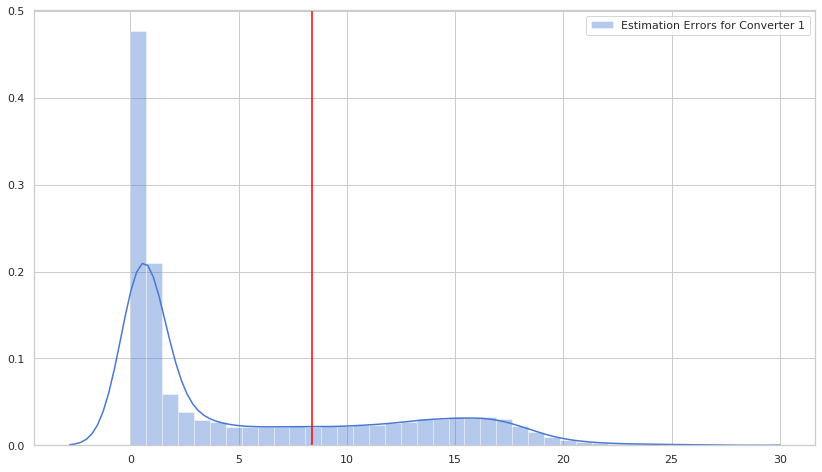

In [26]:
#Converter 1 anomalies
sns.distplot(x1_test2_mae,kde=True,label='Estimation Errors for Converter 1')
plt.legend()
plt.axvline(t1,0,10,color='red')

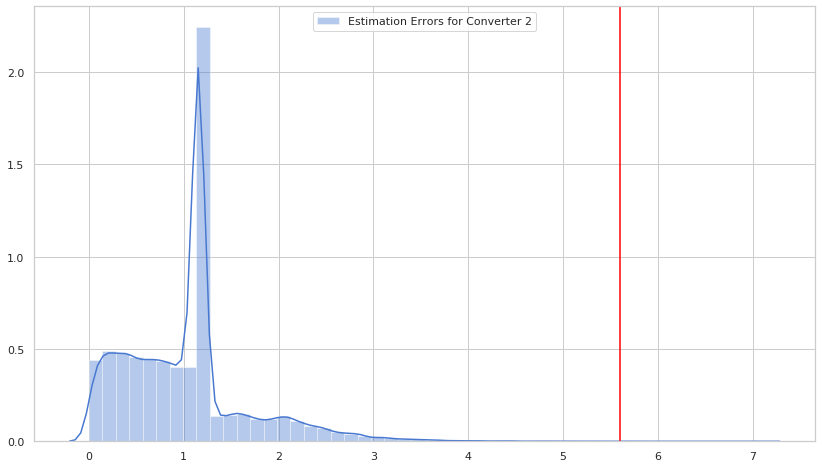

In [27]:
#Converter 2 anomalies
sns.distplot(x2_test2_mae,kde=True,label='Estimation Errors for Converter 2')
plt.legend()
plt.axvline(t2,0,10,color='red')

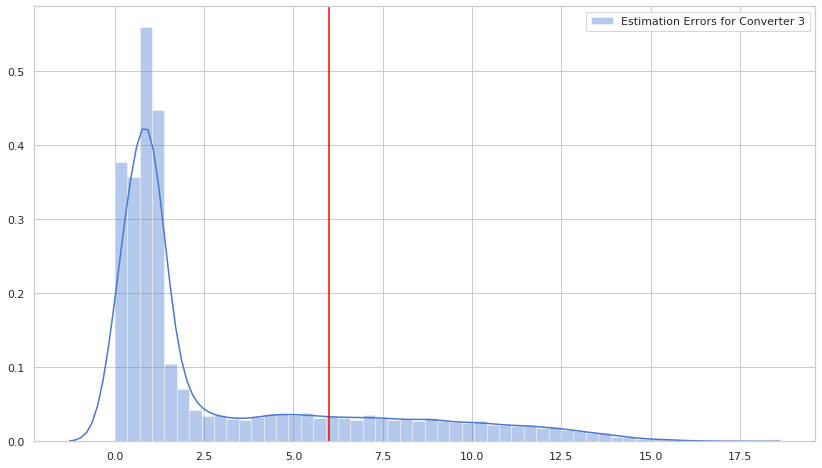

In [28]:
#Converter 3 anomalies
sns.distplot(x3_test2_mae,kde=True,label='Estimation Errors for Converter 3')
plt.legend()
plt.axvline(t3,0,10,color='red')

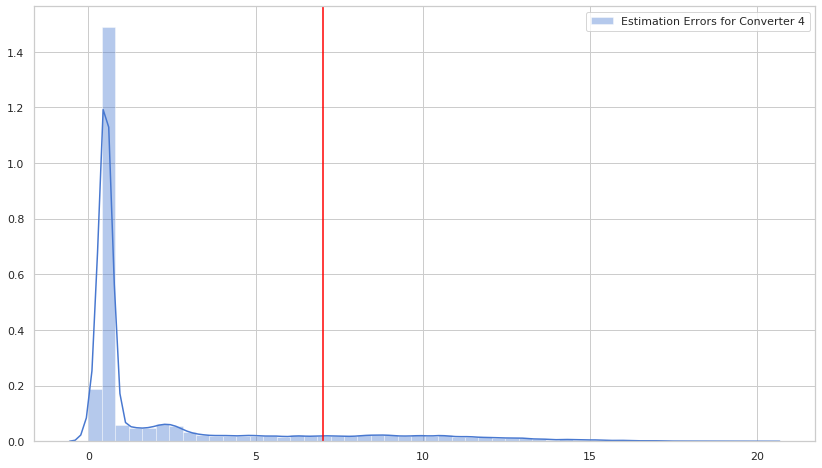

In [29]:
#Converter 4 anomalies
sns.distplot(x4_test2_mae,kde=True,label='Estimation Errors for Converter 4')
plt.legend()
plt.axvline(t4,0,10,color='red')

In [30]:
#Plotting the anomalies for 1st converter
fig = go.Figure()
fig.add_trace(go.Scatter(x=test2.Time[15:],y=(test2.factor1[15:]*f1_std + f1_mean),mode='lines',name='Norm Difference for Converter 1'))
fig.add_trace(go.Scatter(x=test2_df[test2_df['Anomaly 1']==True].Time,y = (test2_df[test2_df['Anomaly 1']==True].factor1*f1_std + f1_mean),mode='markers',name='Anomalies in Converter 1'))
fig.update_layout(showlegend=True)
fig.show()

In [31]:
#Plotting the anomalies for 2nd converter
fig = go.Figure()
fig.add_trace(go.Scatter(x=test2.Time[15:],y=(test2.factor2[15:]*f2_std + f2_mean),mode='lines',name='Norm Difference for Converter 2'))
fig.add_trace(go.Scatter(x=test2_df[test2_df['Anomaly 2']==True].Time,y = (test2_df[test2_df['Anomaly 2']==True].factor2*f2_std + f2_mean),mode='markers',name='Anomalies in Converter 2'))
fig.update_layout(showlegend=True)
fig.show()

In [32]:
#Plotting the anomalies for 3rd converter
fig = go.Figure()
fig.add_trace(go.Scatter(x=test2.Time[15:],y=(test2.factor3[15:]*f3_std + f3_mean),mode='lines',name='Norm Difference for Converter 3'))
fig.add_trace(go.Scatter(x=test2_df[test2_df['Anomaly 3']==True].Time,y = (test2_df[test2_df['Anomaly 3']==True].factor3*f3_std + f3_mean),mode='markers',name='Anomalies in Converter 3'))
fig.update_layout(showlegend=True)
fig.show()

In [33]:
#Plotting the anomalies for 4th converter
fig = go.Figure()
fig.add_trace(go.Scatter(x=test2.Time[15:],y=(test2.factor4[15:]*f4_std + f4_mean),mode='lines',name='Norm Difference for Converter 4'))
fig.add_trace(go.Scatter(x=test2_df[test2_df['Anomaly 4']==True].Time,y = (test2_df[test2_df['Anomaly 4']==True].factor4*f4_std + f4_mean),mode='markers',name='Anomalies in Converter 4'))
fig.update_layout(showlegend=True)
fig.show()

### Normal communication delay of 0.033ms

In [34]:
#Load dataset
test3 = pd.read_csv('../input/test-norms/delay.csv')
test3 = test3[test3.Time>0.1]
test3 = test3.reset_index(drop=True)
test3.head()

#Apply same transformation on the test data
#We are using a sequence size of 15
test3.factor1 = (test3.factor1-f1_mean)/f1_std
test3.factor2 = (test3.factor2-f2_mean)/f2_std
test3.factor3 = (test3.factor3-f3_mean)/f3_std
test3.factor4 = (test3.factor4-f4_mean)/f4_std

#plot standardized signals
fig = go.Figure()
fig.add_trace(go.Scatter(x=test3.Time,y=test3.factor1,mode='lines',name='Norm Difference for converter 1'))
fig.add_trace(go.Scatter(x=test3.Time,y=test3.factor2,mode='lines',name='Norm Difference for converter 2'))
fig.add_trace(go.Scatter(x=test3.Time,y=test3.factor3,mode='lines',name='Norm Difference for converter 3'))
fig.add_trace(go.Scatter(x=test3.Time,y=test3.factor4,mode='lines',name='Norm Difference for converter 4'))
fig.update_layout(showlegend=True)
fig.show()

x1_test3,y1_test3 = create_sequences(test3.factor1,test3.factor1,15)
x2_test3,y2_test3 = create_sequences(test3.factor2,test3.factor2,15)
x3_test3,y3_test3 = create_sequences(test3.factor3,test3.factor3,15)
x4_test3,y4_test3 = create_sequences(test3.factor4,test3.factor4,15)
x1_test3 = x1_test3.reshape(x1_test3.shape[0],15,1)
x2_test3 = x2_test3.reshape(x2_test3.shape[0],15,1)
x3_test3 = x3_test3.reshape(x3_test3.shape[0],15,1)
x4_test3 = x4_test3.reshape(x4_test3.shape[0],15,1)
y1_test3 = y1_test3.reshape(y1_test3.shape[0],1)
y2_test3 = y2_test3.reshape(y2_test3.shape[0],1)
y3_test3 = y3_test3.reshape(y3_test3.shape[0],1)
y4_test3 = y4_test3.reshape(y4_test3.shape[0],1)

#Results for the third test
x1_test3_mae = np.mean(np.abs(model_one.predict(x1_test3)-y1_test3),axis=1)
x2_test3_mae = np.mean(np.abs(model_two.predict(x2_test3)-y2_test3),axis=1)
x3_test3_mae = np.mean(np.abs(model_three.predict(x3_test3)-y3_test3),axis=1)
x4_test3_mae = np.mean(np.abs(model_four.predict(x4_test3)-y4_test3),axis=1)
test3_df = pd.DataFrame({'Time':test3.Time[15:],'factor1':test3.factor1[15:],'factor2':test3.factor2[15:],'factor3':test3.factor3[15:],'factor4':test3.factor4[15:]})
test3_df['loss 1'] = x1_test3_mae
test3_df['loss 2'] = x2_test3_mae
test3_df['loss 3'] = x3_test3_mae
test3_df['loss 4'] = x4_test3_mae
test3_df['Anomaly 1'] = test3_df['loss 1']>t1
test3_df['Anomaly 2'] = test3_df['loss 2']>t2
test3_df['Anomaly 3'] = test3_df['loss 3']>t3
test3_df['Anomaly 4'] = test3_df['loss 4']>t4

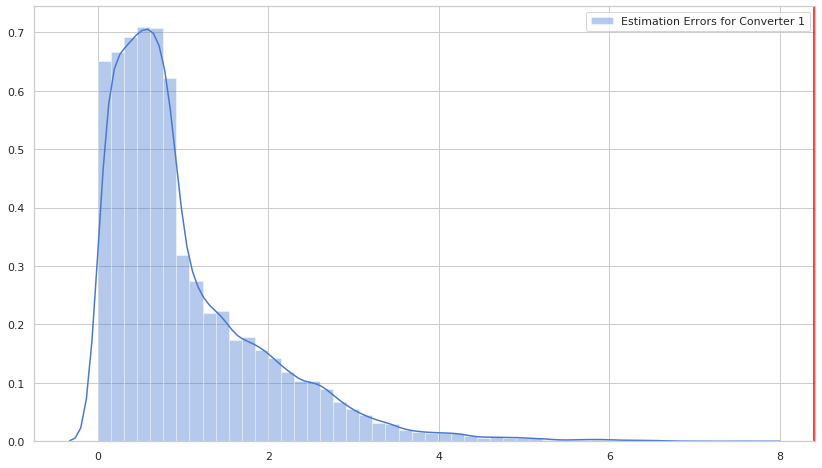

In [35]:
#Converter 1 anomalies
sns.distplot(x1_test3_mae,kde=True,label='Estimation Errors for Converter 1')
plt.legend()
plt.axvline(t1,0,10,color='red')

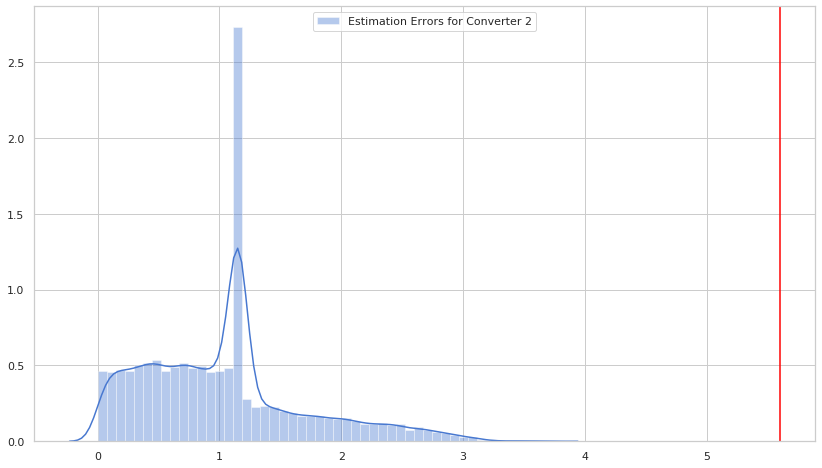

In [36]:
#Converter 2 anomalies
sns.distplot(x2_test3_mae,kde=True,label='Estimation Errors for Converter 2')
plt.legend()
plt.axvline(t2,0,10,color='red')

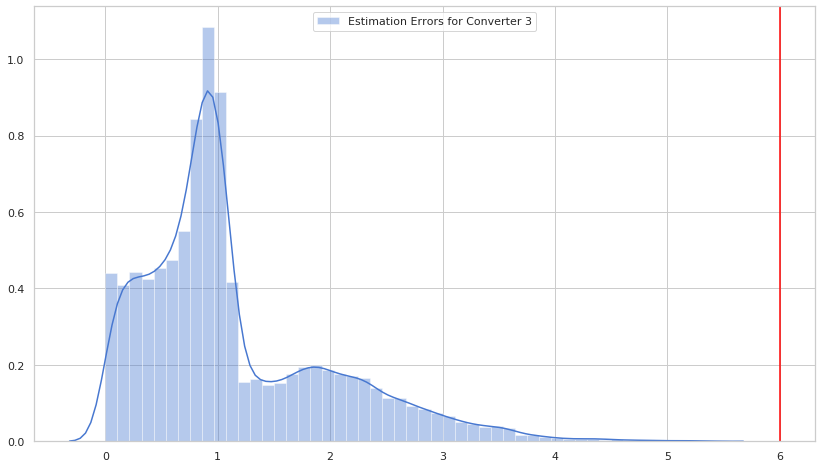

In [37]:
#Converter 3 anomalies
sns.distplot(x3_test3_mae,kde=True,label='Estimation Errors for Converter 3')
plt.legend()
plt.axvline(t3,0,10,color='red')

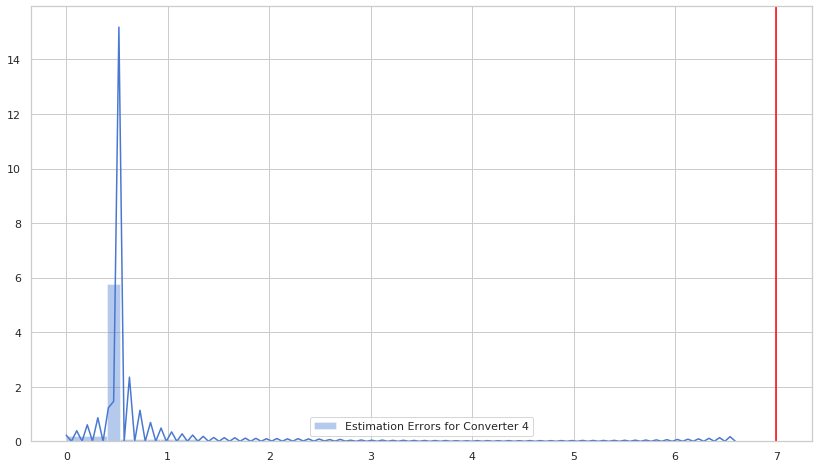

In [38]:
#Converter 4 anomalies
sns.distplot(x4_test3_mae,kde=True,label='Estimation Errors for Converter 4')
plt.legend()
plt.axvline(t4,0,10,color='red')

In [39]:
#Plotting the anomalies for 1st converter
fig = go.Figure()
fig.add_trace(go.Scatter(x=test3.Time[15:],y=(test3.factor1[15:]*f1_std + f1_mean),mode='lines',name='Norm Difference for Converter 1'))
fig.add_trace(go.Scatter(x=test3_df[test3_df['Anomaly 1']==True].Time,y = (test3_df[test3_df['Anomaly 1']==True].factor1*f1_std + f1_mean),mode='markers',name='Anomalies in Converter 1'))
fig.update_layout(showlegend=True)
fig.show()

In [40]:
#Plotting the anomalies for 2nd converter
fig = go.Figure()
fig.add_trace(go.Scatter(x=test3.Time[15:],y=(test3.factor2[15:]*f2_std + f2_mean),mode='lines',name='Norm Difference for Converter 2'))
fig.add_trace(go.Scatter(x=test3_df[test3_df['Anomaly 2']==True].Time,y = (test3_df[test3_df['Anomaly 2']==True].factor2*f2_std + f2_mean),mode='markers',name='Anomalies in Converter 2'))
fig.update_layout(showlegend=True)
fig.show()

In [41]:
#Plotting the anomalies for 3rd converter
fig = go.Figure()
fig.add_trace(go.Scatter(x=test3.Time[15:],y=(test3.factor3[15:]*f3_std + f3_mean),mode='lines',name='Norm Difference for Converter 3'))
fig.add_trace(go.Scatter(x=test3_df[test3_df['Anomaly 3']==True].Time,y = (test3_df[test3_df['Anomaly 3']==True].factor3*f3_std + f3_mean),mode='markers',name='Anomalies in Converter 3'))
fig.update_layout(showlegend=True)
fig.show()

In [42]:
#Plotting the anomalies for 4th converter
fig = go.Figure()
fig.add_trace(go.Scatter(x=test3.Time[15:],y=(test3.factor4[15:]*f4_std + f4_mean),mode='lines',name='Norm Difference for Converter 4'))
fig.add_trace(go.Scatter(x=test3_df[test3_df['Anomaly 4']==True].Time,y = (test3_df[test3_df['Anomaly 4']==True].factor4*f4_std + f4_mean),mode='markers',name='Anomalies in Converter 4'))
fig.update_layout(showlegend=True)
fig.show()

#### 4. Normal weight Node attack(8% of the steady state value)


In [43]:
#Load dataset
test4 = pd.read_csv('../input/test-norms/normal_weight_node.csv')
test4 = test4[test4.Time>0.1]
test4 = test4.reset_index(drop=True)
test4.head()

#Apply same transformation on the test data
#We are using a sequence size of 15
test4.factor1 = (test4.factor1-f1_mean)/f1_std
test4.factor2 = (test4.factor2-f2_mean)/f2_std
test4.factor3 = (test4.factor3-f3_mean)/f3_std
test4.factor4 = (test4.factor4-f4_mean)/f4_std

#plot standardized signals
fig = go.Figure()
fig.add_trace(go.Scatter(x=test4.Time,y=test4.factor1,mode='lines',name='Norm Difference for converter 1'))
fig.add_trace(go.Scatter(x=test4.Time,y=test4.factor2,mode='lines',name='Norm Difference for converter 2'))
fig.add_trace(go.Scatter(x=test4.Time,y=test4.factor3,mode='lines',name='Norm Difference for converter 3'))
fig.add_trace(go.Scatter(x=test4.Time,y=test4.factor4,mode='lines',name='Norm Difference for converter 4'))
fig.update_layout(showlegend=True)
fig.show()

x1_test4,y1_test4 = create_sequences(test4.factor1,test4.factor1,15)
x2_test4,y2_test4 = create_sequences(test4.factor2,test4.factor2,15)
x3_test4,y3_test4 = create_sequences(test4.factor3,test4.factor3,15)
x4_test4,y4_test4 = create_sequences(test4.factor4,test4.factor4,15)
x1_test4 = x1_test4.reshape(x1_test4.shape[0],15,1)
x2_test4 = x2_test4.reshape(x2_test4.shape[0],15,1)
x3_test4 = x3_test4.reshape(x3_test4.shape[0],15,1)
x4_test4 = x4_test4.reshape(x4_test4.shape[0],15,1)
y1_test4 = y1_test4.reshape(y1_test4.shape[0],1)
y2_test4 = y2_test4.reshape(y2_test4.shape[0],1)
y3_test4 = y3_test4.reshape(y3_test4.shape[0],1)
y4_test4 = y4_test4.reshape(y4_test4.shape[0],1)

#Results for the fourth test
x1_test4_mae = np.mean(np.abs(model_one.predict(x1_test4)-y1_test4),axis=1)
x2_test4_mae = np.mean(np.abs(model_two.predict(x2_test4)-y2_test4),axis=1)
x3_test4_mae = np.mean(np.abs(model_three.predict(x3_test4)-y3_test4),axis=1)
x4_test4_mae = np.mean(np.abs(model_four.predict(x4_test4)-y4_test4),axis=1)
test4_df = pd.DataFrame({'Time':test4.Time[15:],'factor1':test4.factor1[15:],'factor2':test4.factor2[15:],'factor3':test4.factor3[15:],'factor4':test4.factor4[15:]})
test4_df['loss 1'] = x1_test4_mae
test4_df['loss 2'] = x2_test4_mae
test4_df['loss 3'] = x3_test4_mae
test4_df['loss 4'] = x4_test4_mae
test4_df['Anomaly 1'] = test4_df['loss 1']>t1
test4_df['Anomaly 2'] = test4_df['loss 2']>t2
test4_df['Anomaly 3'] = test4_df['loss 3']>t3
test4_df['Anomaly 4'] = test4_df['loss 4']>t4

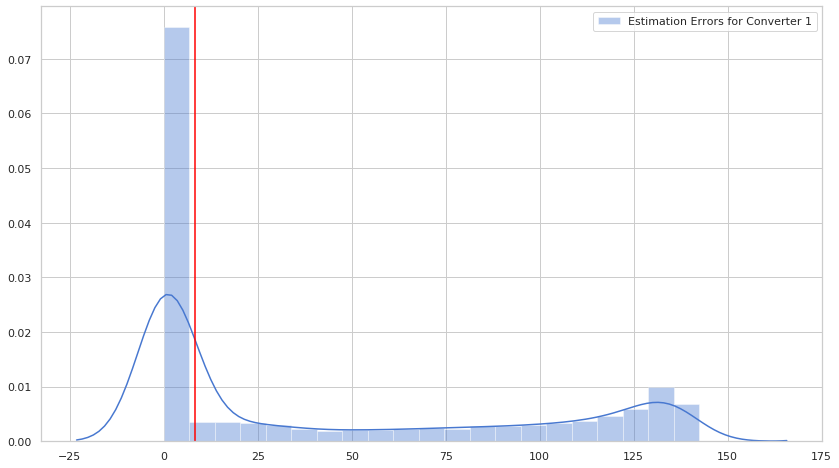

In [44]:
#Converter 1 anomalies
sns.distplot(x1_test4_mae,kde=True,label='Estimation Errors for Converter 1')
plt.legend()
plt.axvline(t1,0,10,color='red')

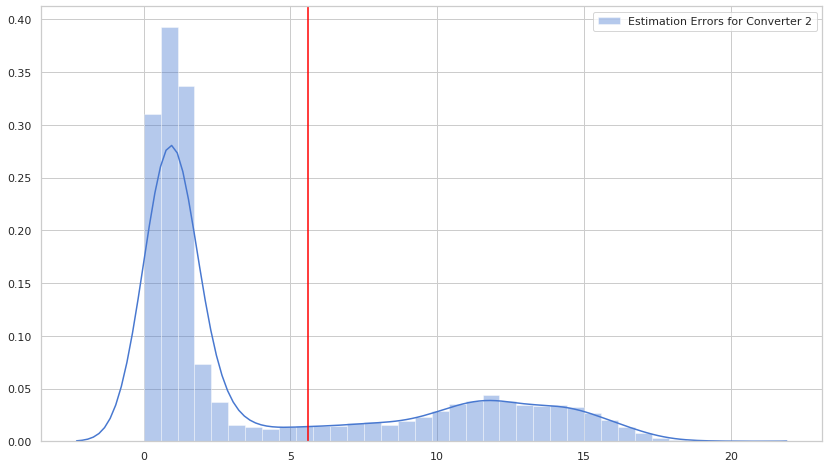

In [45]:
#Converter 2 anomalies
sns.distplot(x2_test4_mae,kde=True,label='Estimation Errors for Converter 2')
plt.legend()
plt.axvline(t2,0,10,color='red')

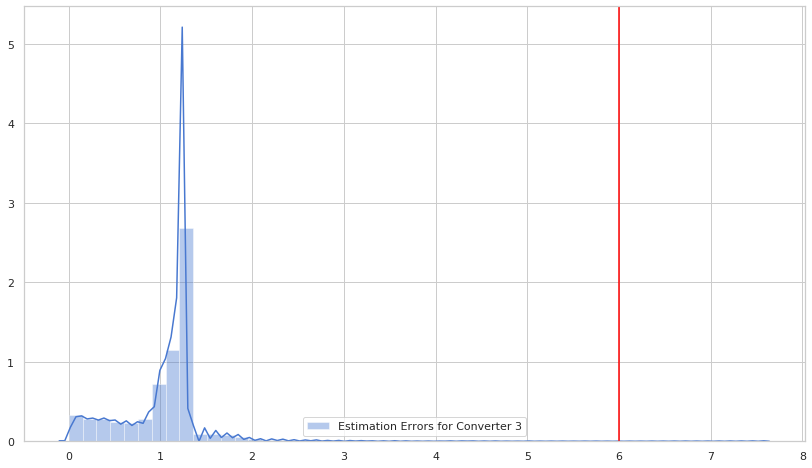

In [46]:
#Converter 3 anomalies
sns.distplot(x3_test4_mae,kde=True,label='Estimation Errors for Converter 3')
plt.legend()
plt.axvline(t3,0,10,color='red')

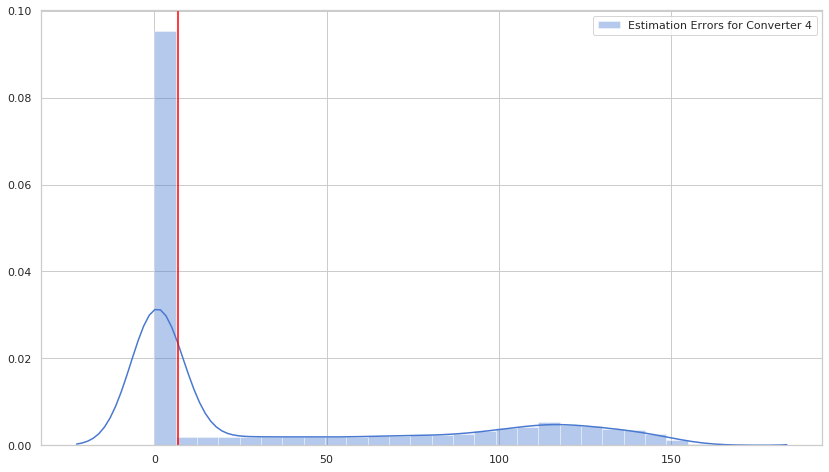

In [47]:
#Converter 4 anomalies
sns.distplot(x4_test4_mae,kde=True,label='Estimation Errors for Converter 4')
plt.legend()
plt.axvline(t4,0,10,color='red')

In [48]:
#Plotting the anomalies for 1st converter
fig = go.Figure()
fig.add_trace(go.Scatter(x=test4.Time[15:],y=(test4.factor1[15:]*f1_std + f1_mean),mode='lines',name='Norm Difference for Converter 1'))
fig.add_trace(go.Scatter(x=test4_df[test4_df['Anomaly 1']==True].Time,y = (test4_df[test4_df['Anomaly 1']==True].factor1*f1_std + f1_mean),mode='markers',name='Anomalies in Converter 1'))
fig.update_layout(showlegend=True)
fig.show()

In [49]:
#Plotting the anomalies for 2nd converter
fig = go.Figure()
fig.add_trace(go.Scatter(x=test4.Time[15:],y=(test4.factor2[15:]*f2_std + f2_mean),mode='lines',name='Norm Difference for Converter 2'))
fig.add_trace(go.Scatter(x=test4_df[test4_df['Anomaly 2']==True].Time,y = (test4_df[test4_df['Anomaly 2']==True].factor2*f2_std + f2_mean),mode='markers',name='Anomalies in Converter 2'))
fig.update_layout(showlegend=True)
fig.show()

In [50]:
#Plotting the anomalies for 3rd converter
fig = go.Figure()
fig.add_trace(go.Scatter(x=test4.Time[15:],y=(test4.factor3[15:]*f3_std + f3_mean),mode='lines',name='Norm Difference for Converter 3'))
fig.add_trace(go.Scatter(x=test4_df[test4_df['Anomaly 3']==True].Time,y = (test4_df[test4_df['Anomaly 3']==True].factor3*f3_std + f3_mean),mode='markers',name='Anomalies in Converter 3'))
fig.update_layout(showlegend=True)
fig.show()

In [51]:
#Plotting the anomalies for 4th converter
fig = go.Figure()
fig.add_trace(go.Scatter(x=test4.Time[15:],y=(test4.factor4[15:]*f4_std + f4_mean),mode='lines',name='Norm Difference for Converter 4'))
fig.add_trace(go.Scatter(x=test4_df[test4_df['Anomaly 4']==True].Time,y = (test4_df[test4_df['Anomaly 4']==True].factor4*f4_std + f4_mean),mode='markers',name='Anomalies in Converter 4'))
fig.update_layout(showlegend=True)
fig.show()